# BertViz Interactive Demo: Head View

[Orginal notebook reference](https://github.com/jessevig/BertViz)

Step 6 added by Denis Rothman, copyright 2023, MIT License




#Step 1: Installing BertViz and importing the modules

In [1]:
from IPython.display import Image     #This is used for rendering images in the notebook

In [ ]:
!pip install bertviz

In [3]:
from bertviz import head_view,model_view
from transformers import BertTokenizer, BertModel

#Step 2: Load the models and retrieve attention

In [4]:
# Load model and retrieve attention
model_version = 'bert-base-uncased'
do_lower_case = True
model = BertModel.from_pretrained(model_version, output_attentions=True)
tokenizer = BertTokenizer.from_pretrained(model_version, do_lower_case=do_lower_case)
sentence_a = "A lot of people like animals so they adopt cats"
sentence_b = "A lot of people like animals so they adopt dogs"
inputs = tokenizer.encode_plus(sentence_a, sentence_b, return_tensors='pt', add_special_tokens=True)
token_type_ids = inputs['token_type_ids']
input_ids = inputs['input_ids']
attention = model(input_ids, token_type_ids=token_type_ids)[-1]
sentence_b_start = token_type_ids[0].tolist().index(1)
input_id_list = input_ids[0].tolist() # Batch index 0
tokens = tokenizer.convert_ids_to_tokens(input_id_list)

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.seq_relationship.bias', 'cls.predictions.decoder.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


#Step 3: Head view
The attention-head view visualizes attention in one or more heads in a particular layer in the model.

## Usage
* **Hover** over any **token** on the left/right side of the visualization to filter attention from/to that token. The colors correspond to different attention heads.
* **Double-click** on any of the **colored tiles** at the top to filter to the corresponding attention head.
* **Single-click** on any of the **colored tiles** to toggle selection of the corresponding attention head. 
* **Click** on the **Layer** drop-down to change the model layer (zero-indexed).
* The lines show the attention from each token (left) to every other token (right). Darker lines indicate higher attention weights. When multiple heads are selected, the attention weights are overlaid on one another. 

In [5]:
head_view(attention, tokens)

<IPython.core.display.Javascript object>

#Step 4: Processing and displaying attention heads
# Model View
The model view gives a birds-eye view of attention across all of the layers (rows) and heads (columns) in the model. In this case we are showing *bert-base*, which has 12 layers and 12 heads (zero-indexed). 

## Usage
* **Click** on any **cell** for a detailed view of attention for the associated attention head.
* Then **hover** over any **token** on the left side of detail view to filter the attention from that token.
* The lines show the attention from each token (left) to every other token (right). Darker lines indicate higher attention weights.  

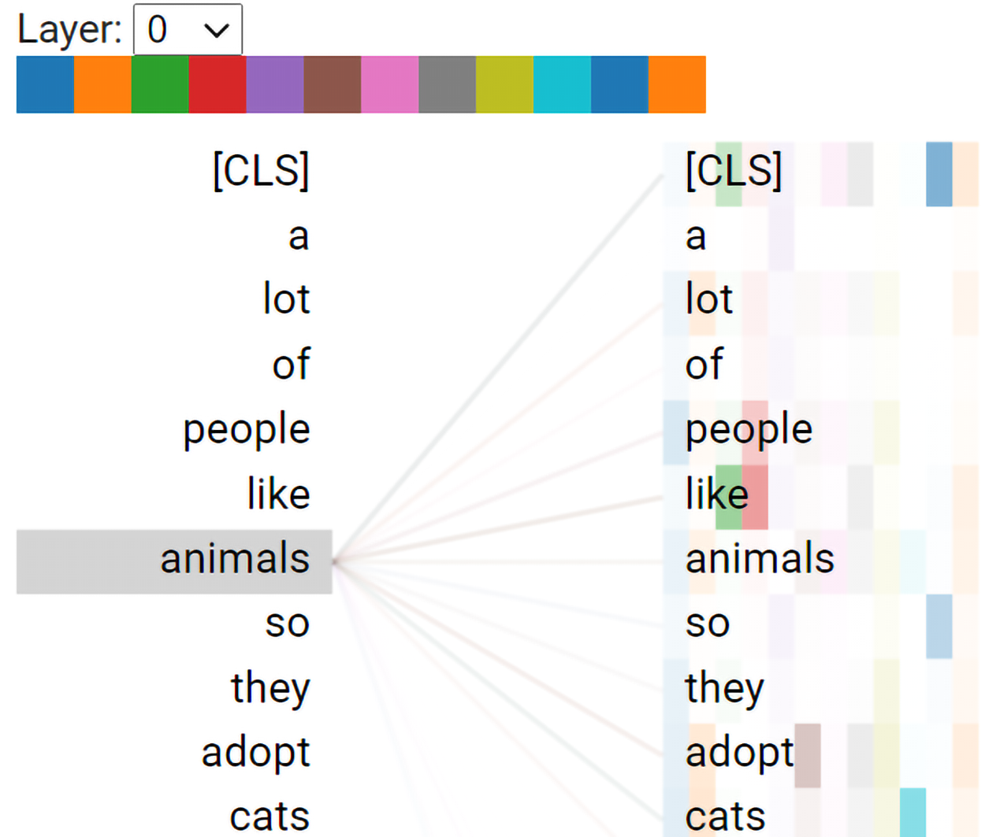

In [6]:
Image('https://github.com/Denis2054/Transformers-for-NLP-2nd-Edition/raw/main/Notebook%20images/14/B17948_14_02.png', width=400) #This is used for rendering images in the notebook

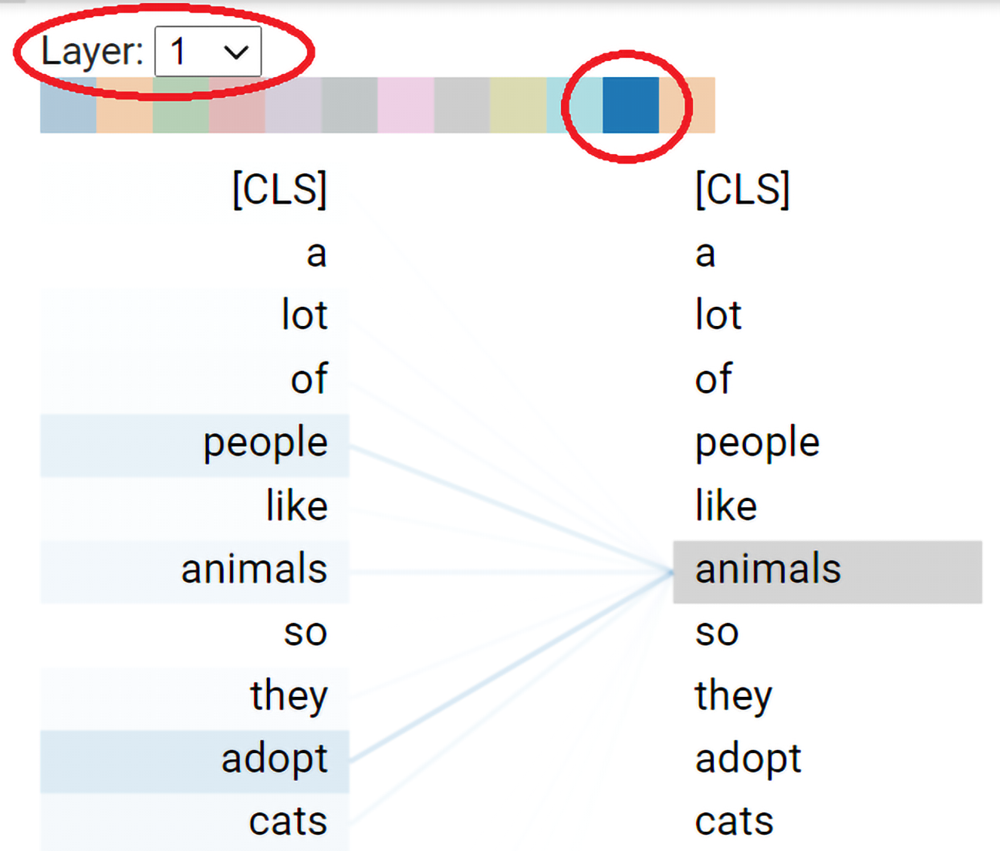

In [7]:
Image('https://github.com/Denis2054/Transformers-for-NLP-2nd-Edition/raw/main/Notebook%20images/14/B17948_14_03.png', width=400) #This is used for rendering images in the notebook

#Step 5: Model view

In [8]:
model_view(attention, tokens, sentence_b_start)

<IPython.core.display.Javascript object>

# Step 6: Score Views

In [ ]:
#Installing Hugging Face transformers
!pip install transformers

In [10]:
from transformers import BertTokenizer, BertModel

In [16]:
%%capture 
input_text = "The output shows the attention values" #@param {type:"string"}

print(input_text)

## Streaming the output of the attention heads

In [22]:
from transformers import BertTokenizer, BertModel

# Load the BERT model and tokenizer
model_name = 'bert-base-uncased'
tokenizer = BertTokenizer.from_pretrained(model_name)
model = BertModel.from_pretrained(model_name, output_attentions=True)

# Tokenize the input text
tokens = tokenizer.tokenize(input_text)
input_ids = tokenizer.convert_tokens_to_ids(tokens)

# Get the attention matrix
inputs = tokenizer.encode_plus(input_text, return_tensors='pt')
input_ids = inputs['input_ids']
attention_mask = inputs['attention_mask']
outputs = model(input_ids, attention_mask=attention_mask)
attentions = outputs.attentions

# Visualize the attention head activity
for layer, attention in enumerate(attentions):
    print(f"Layer {layer+1}:")
    for head, head_attention in enumerate(attention[0]):
        print(f"Head {head+1}:")
        for source_token, target_tokens in enumerate(head_attention[:len(tokens)]):
            print(f"Source token '{tokens[source_token]}' (index {source_token+1}):")
            for target_token, attention_value in enumerate(target_tokens[:len(tokens)]):
                print(f"Target token '{tokens[target_token]}' (index {target_token+1}): {attention_value}")

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.seq_relationship.bias', 'cls.predictions.decoder.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Streaming output truncated to the last 5000 lines.
Target token 'the' (index 4): 0.059721238911151886
Target token 'attention' (index 5): 0.05109033361077309
Target token 'values' (index 6): 0.00588712003082037
Head 5:
Source token 'the' (index 1):
Target token 'the' (index 1): 0.707478940486908
Target token 'output' (index 2): 0.0336444154381752
Target token 'shows' (index 3): 0.017859840765595436
Target token 'the' (index 4): 0.03474975749850273
Target token 'attention' (index 5): 0.034133099019527435
Target token 'values' (index 6): 0.029946431517601013
Source token 'output' (index 2):
Target token 'the' (index 1): 0.5405372381210327
Target token 'output' (index 2): 0.13389456272125244
Target token 'shows' (index 3): 0.005742241162806749
Target token 'the' (index 4): 0.030298620462417603
Target token 'attention' (index 5): 0.08613064140081406
Target token 'values' (index 6): 0.016523662954568863
Source token 'shows' (index 3):
Target token 'the' (index 1): 0.5343014597892761
Target 

## Visualizing Word Relationships Using Attention Scores with Pandas

In [18]:
#Displaying the outputs in Pandas
import pandas as pd
import ipywidgets as widgets

# Create a DataFrame for each layer and head's attention matrix
df_layers_heads = []
for layer, attention in enumerate(attentions):
    for head, head_attention in enumerate(attention[0]):
        attention_matrix = head_attention[:len(tokens), :len(tokens)].detach().numpy()  # detach the tensor from gradients and convert to numpy
        df_attention = pd.DataFrame(attention_matrix, index=tokens, columns=tokens)
        df_layers_heads.append((layer, head, df_attention))

# Set the DataFrame display options for better visualization
pd.set_option('display.max_columns', None)  
pd.set_option('display.expand_frame_repr', False)
pd.set_option('max_colwidth', None)

# Function to display the attention matrix
def display_attention(selected_layer, selected_head):
    _, _, df_to_display = next(df for df in df_layers_heads if df[0] == selected_layer and df[1] == selected_head)
    display(df_to_display)

# Create interactive widgets for the layer and head
layer_widget = widgets.IntSlider(min=0, max=len(attentions)-1, step=1, description='Layer:')
head_widget = widgets.IntSlider(min=0, max=len(attentions[0][0])-1, step=1, description='Head:')

# Use the widgets to interact with the function
widgets.interact(display_attention, selected_layer=layer_widget, selected_head=head_widget)

interactive(children=(IntSlider(value=0, description='Layer:', max=11), IntSlider(value=0, description='Head:'…

<function __main__.display_attention(selected_layer, selected_head)>

## Additional Information

In [21]:
# Printing the number of layers and number of heads
num_layers = len(attentions)
num_heads = len(attentions[0][0])

print(f"Number of layers: {num_layers}")
print(f"Number of heads: {num_heads}")


Number of layers: 12
Number of heads: 12


In [24]:
#Printing the value of d_model 
import math

# Get the configuration from the model
config = model.config

# Extract d_model
d_model = config.hidden_size

# Calculate and print the square root of d_model
sqrt_d_model = math.sqrt(d_model)
print('d_model', d_model,' Square root of d_model:', sqrt_d_model)

d_model 768  Square root of d_model: 27.712812921102035


In [25]:
#printing the value of dk 
# Get the configuration from the model
config = model.config

# Extract d_model and number of attention heads
d_model = config.hidden_size
num_attention_heads = config.num_attention_heads

# Calculate dk (reduced dimensionality per head)
dk = d_model // num_attention_heads

# Calculate and print the square root of dk
sqrt_dk = math.sqrt(dk)
print('dk:', dk)
print('Square root of dk:', sqrt_dk)

dk: 64
Square root of dk: 8.0
